# <center>Data Analysis for Fraud Detection

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

from sklearn import decomposition
from sklearn.preprocessing import StandardScaler

import warnings 
warnings.filterwarnings("ignore")

In [2]:
df = pd.read_csv("final_data.csv")
df.drop(["Unnamed: 0"],axis=1,inplace=True)
print(df.shape)
df.head()

(28836, 43)


,CustomerID,InsuredAge,InsuredZipCode,InsuredGender,InsuredEducationLevel,InsuredOccupation,InsuredHobbies,CapitalGains,CapitalLoss,InsurancePolicyNumber,...,Witnesses,PoliceReport,AmountOfTotalClaim,AmountOfInjuryClaim,AmountOfPropertyClaim,AmountOfVehicleDamage,Year,Month,days,ReportedFraud
0,Cust10000,35,454776,MALE,JD,armed-forces,movies,56700,-48500,119121,...,0.0,NoReport,65501.0,13417,6071,46013,2015,2,3,N
1,Cust10001,36,454776,MALE,JD,tech-support,cross-fit,70600,-48500,119122,...,1.0,YES,61382.0,15560,5919,39903,2015,2,2,N
2,Cust10002,33,603260,MALE,JD,armed-forces,polo,66400,-63700,119123,...,3.0,NO,66755.0,11630,11630,43495,2015,1,15,N
3,Cust10003,36,474848,MALE,JD,armed-forces,polo,47900,-73400,119124,...,3.0,NO,66243.0,12003,12003,42237,2015,1,19,N
4,Cust10004,29,457942,FEMALE,High School,exec-managerial,dancing,0,-41500,119125,...,1.0,YES,53544.0,8829,7234,37481,2015,1,9,N


In [3]:
#check for null values
df.isnull().sum().sum()

0

In [4]:
#check for duplicate values
df.duplicated().sum().sum()

0

In [5]:
# Combined single limit coverage is the maximum dollar amount an insurer will pay for all claims resulting from one occurrence.
# Split limit provides separate maximum dollar amounts an insurer will pay for bodily injury and property damage.

#Spliting the Policy CombinedSingleLimit into split-limit and combinedsinglelimit
df['Policy_SplitLimit'] = df['Policy_CombinedSingleLimit'].apply(lambda x: int(x.split("/")[0]))
df['Policy_CombinedSingleLimit'] = df['Policy_CombinedSingleLimit'].apply(lambda x: int(x.split("/")[1]))

In [6]:
df.describe()

,InsuredAge,InsuredZipCode,CapitalGains,CapitalLoss,InsurancePolicyNumber,CustomerLoyaltyPeriod,Policy_CombinedSingleLimit,Policy_Deductible,PolicyAnnualPremium,UmbrellaLimit,...,BodilyInjuries,Witnesses,AmountOfTotalClaim,AmountOfInjuryClaim,AmountOfPropertyClaim,AmountOfVehicleDamage,Year,Month,days,Policy_SplitLimit
count,28836.000000,28836.000000,28836.000000,28836.000000,28836.000000,28836.000000,28836.000000,28836.000000,28836.000000,2.883600e+04,...,28836.000000,28836.00000,28836.000000,28836.000000,28836.000000,28836.000000,28836.0,28836.000000,28836.000000,28836.000000
mean,38.815370,502436.579068,23066.569566,-24940.612429,129312.517097,203.067867,583.631572,1114.282529,1261.725810,9.836680e+05,...,0.985782,1.48429,52319.038355,7337.118428,7283.870197,37687.129387,2015.0,1.495110,15.010300,274.488487
std,7.996377,72250.868871,27637.813724,27913.209608,11114.060267,99.932951,288.259012,546.632816,204.882653,1.969282e+06,...,0.784764,1.04469,25080.664083,4427.638593,4375.842738,17977.048232,0.0,0.516162,7.603878,161.360712
min,19.000000,430104.000000,0.000000,-111100.000000,110122.000000,1.000000,300.000000,500.000000,436.280000,-1.000000e+06,...,0.000000,-1.00000,150.000000,0.000000,0.000000,109.000000,2015.0,1.000000,1.000000,100.000000
25%,33.000000,448603.000000,0.000000,-50000.000000,119698.750000,126.000000,300.000000,622.000000,1125.247500,0.000000e+00,...,0.000000,1.00000,44686.250000,4743.750000,4862.000000,32193.250000,2015.0,1.000000,9.000000,100.000000
50%,38.000000,466691.000000,0.000000,0.000000,129278.500000,199.000000,500.000000,1000.000000,1266.440000,0.000000e+00,...,1.000000,1.00000,58360.000000,7147.000000,7051.000000,42457.500000,2015.0,1.000000,15.000000,250.000000
75%,44.000000,603848.000000,49000.000000,0.000000,138933.250000,267.000000,1000.000000,1627.000000,1396.605000,4.859610e+05,...,2.000000,2.00000,68961.750000,10571.250000,10327.000000,49535.750000,2015.0,2.000000,21.000000,500.000000
max,64.000000,620962.000000,100500.000000,0.000000,148619.000000,479.000000,1000.000000,2000.000000,2047.590000,1.000000e+07,...,2.000000,3.00000,114920.000000,21450.000000,23670.000000,79560.000000,2015.0,3.000000,31.000000,500.000000


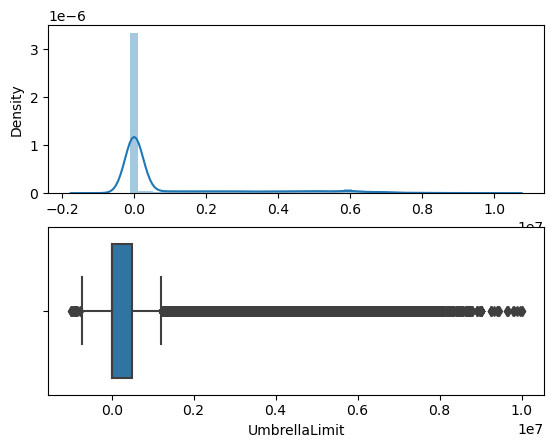

In [7]:
def plot(data,col):
    fig,(ax1,ax2)=plt.subplots(2,1)
    sns.distplot(x = data[col],ax=ax1)
    sns.boxplot(x = data[col],ax=ax2)
plot(df,'UmbrellaLimit')

In [8]:
df[df['UmbrellaLimit']>2000000].shape

(5618, 44)

## Exploratory Data Analysis 

In [9]:
# Our target variable is slightly imbalanced dataset
s = ((df['ReportedFraud'].value_counts()[0])/28836)*100
print("Dataset contains %.1f percentage of Genuine cases"%s)

s = ((df['ReportedFraud'].value_counts()[1])/28836)*100
print("Dataset contains %.1f percentage of Fraud cases"%s)

Dataset contains 73.0 percentage of Genuine cases
Dataset contains 27.0 percentage of Fraud cases


## Univariate analysis
Performing univariate analysis to find which feature can be used to classify the transaction into fraud or not

In [10]:
print(f"Number of unique zip codes : {len(df['InsuredZipCode'].unique())}.")
# Top 10 zipcode from where most fraud has been noted
print(df[df['ReportedFraud']=="Y"]['InsuredZipCode'].value_counts().nlargest(10))

Number of unique zip codes : 995.
476198    68
608331    67
478456    58
606352    55
438529    54
474771    54
469429    54
474801    52
603882    50
613607    50
Name: InsuredZipCode, dtype: int64


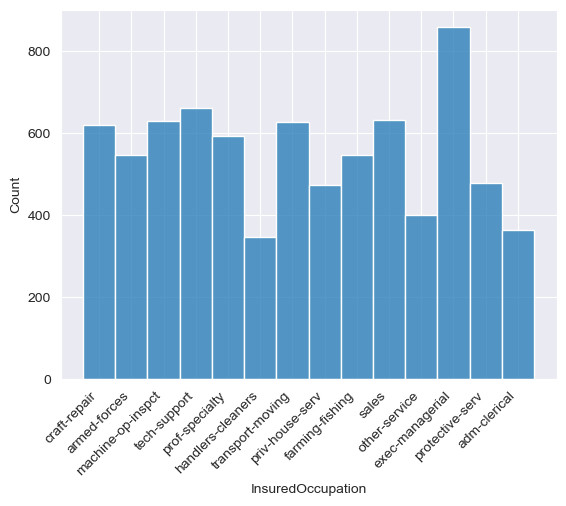

In [11]:
sns.set_style('darkgrid')
sns.histplot(x='InsuredOccupation', data=df[df['ReportedFraud']=="Y"])
plt.xticks(rotation=45, ha='right')
plt.show()

It is shocking that well qualified people at Managerial-level, Tech-support, Sales is involved in fraudulent activity. 

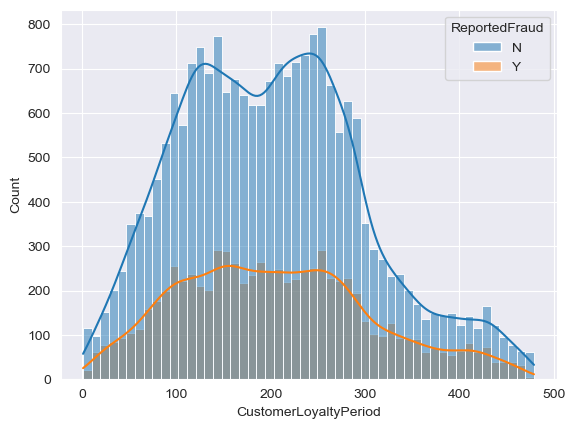

In [12]:
sns.histplot(x='CustomerLoyaltyPeriod',hue="ReportedFraud", data=df, kde=True)
plt.show()

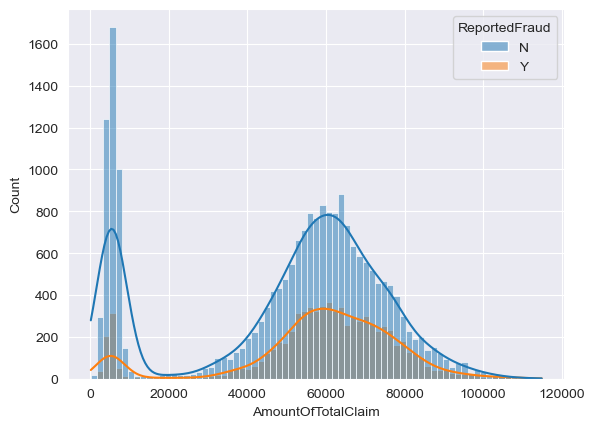

In [13]:
sns.histplot(x='AmountOfTotalClaim',hue="ReportedFraud", data=df, kde=True)
plt.show()

> Top 10 Vehicle Company cars used by customers whose cases reporting Fraudulent activity. 

In [14]:
# Top 10 Vehicle Company cars used by customers whose cases reporting Fraudulent activity. 
df[df['ReportedFraud']=="Y"]['VehicleMake'].value_counts().nlargest(10)

Ford          719
BMW           681
Dodge         658
Audi          653
Suburu        602
Volkswagen    600
Chevrolet     598
Saab          577
Mercedes      551
Toyota        496
Name: VehicleMake, dtype: int64

In [15]:
# cases with MAJOR DAMAGE has most of the Fradulent cases 
a = df[df['ReportedFraud']=="Y"]['SeverityOfIncident'].value_counts()
print("Over {one:.2f}% of Fradulent cases are from {two}".format(one = (a[0]/7785)*100, two=a.index.values[0]))
print("Over {one:.2f}% of Fradulent cases are from {two}".format(one = (a[1]/7785)*100, two=a.index.values[1]))

Over 59.00% of Fradulent cases are from Major Damage
Over 19.72% of Fradulent cases are from Minor Damage


In [16]:
# State with most of the Fradulent cases 
a = df[df['ReportedFraud']=="Y"]['IncidentState'].value_counts()
print("Over {one:.2f}% of Fradulent cases are from {two}".format(one = (a[0]/7785)*100, two=a.index.values[0]))
print("Over {one:.2f}% of Fradulent cases are from {two}".format(one = (a[1]/7785)*100, two=a.index.values[1]))
print("Over {one:.2f}% of Fradulent cases are from {two}".format(one = (a[2]/7785)*100, two=a.index.values[2]))
print("Over {one:.2f}% of Fradulent cases are from {two}".format(one = (a[3]/7785)*100, two=a.index.values[3]))

Over 30.61% of Fradulent cases are from State7
Over 24.17% of Fradulent cases are from State5
Over 15.77% of Fradulent cases are from State9
Over 13.04% of Fradulent cases are from State4


In [17]:
# Having NO-INFO about the property damage has most of the Fradulent cases 
a = df[df['ReportedFraud']=="Y"]['PropertyDamage'].value_counts()
print("Over {one:.2f}% of Fradulent cases are from {two}".format(one = (a[0]/7785)*100, two=a.index.values[0]))
print("Over {one:.2f}% of Fradulent cases are from {two}".format(one = (a[1]/7785)*100, two=a.index.values[1]))

Over 50.33% of Fradulent cases are from NO
Over 49.67% of Fradulent cases are from YES


In [18]:
# cases has NO POLICE REPORT has most of the Fradulent cases 
a = df[df['ReportedFraud']=="Y"]['PoliceReport'].value_counts()
print("Over {one:.2f}% of Fradulent cases are from {two}".format(one = (a[0]/7785)*100, two=a.index.values[0]))
print("Over {one:.2f}% of Fradulent cases are from {two}".format(one = (a[1]/7785)*100, two=a.index.values[1]))
print("Over {one:.2f}% of Fradulent cases are from {two}".format(one = (a[2]/7785)*100, two=a.index.values[2]))

Over 34.75% of Fradulent cases are from NoReport
Over 34.27% of Fradulent cases are from NO
Over 30.98% of Fradulent cases are from YES


## Bi-Variate Analysis

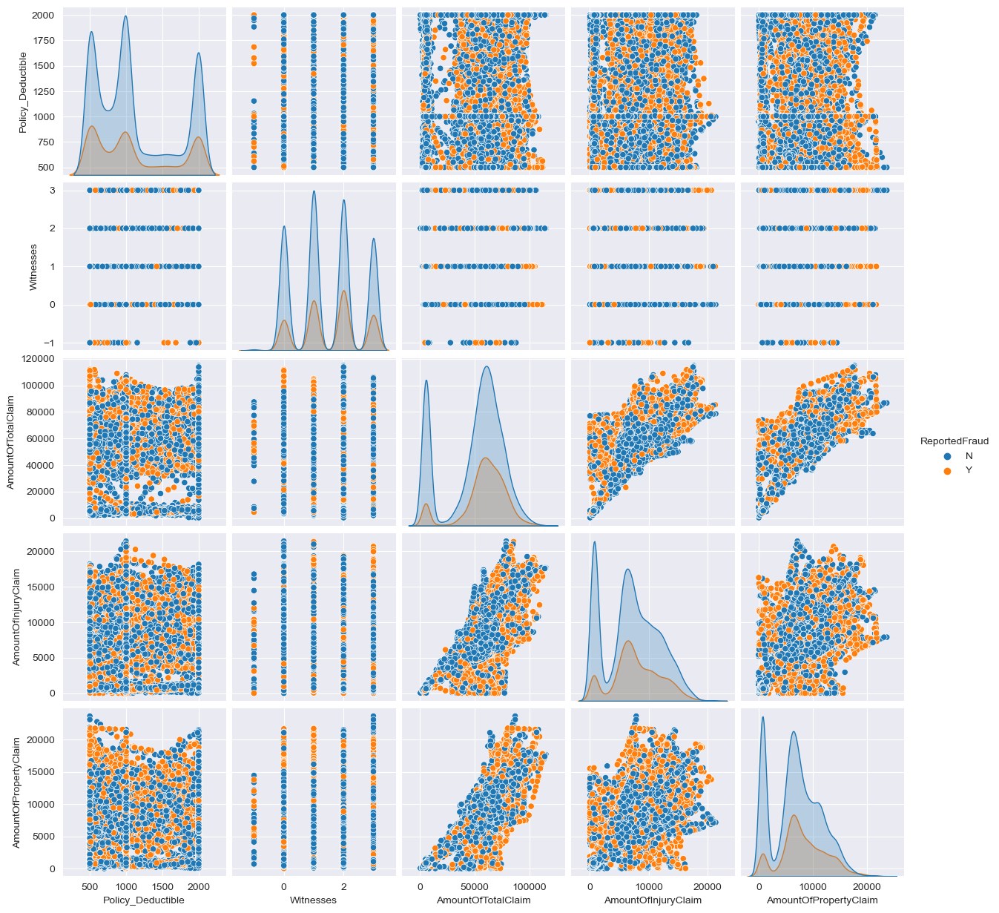

In [19]:
sns.pairplot(df[["Policy_Deductible", "Witnesses","AmountOfTotalClaim", "AmountOfInjuryClaim", "AmountOfPropertyClaim","ReportedFraud"]],hue="ReportedFraud")
plt.show()

## MultiVariate Analysis

In [6]:
fig = px.scatter_3d(df, x="CustomerID", y="InsurancePolicyNumber", z="CustomerLoyaltyPeriod",color='ReportedFraud')
fig.show()

#### From the above graph we can observe that customerID and InsurancePolicyNumber is contirubuting with much higher scale to classify the data into Fraud and NotFraud than any other columns. Keeping these two columns to model will be a great idea.

## Principal Component analysis (PCA) for Visuialization

In [21]:
#Converting every object column into cat code (Integer datatype)
for i in df.columns:
    if df[i].dtype =='object':
        df[i] = df[i].astype("category").cat.codes

In [22]:
df1 = df.drop("ReportedFraud",axis=1).copy()

In [23]:
# Standard Scaling the data for PCA
df_scaled = StandardScaler().fit_transform(df1)

In [24]:
df_scaled.shape

(28836, 43)

In [25]:
pca = decomposition.PCA(n_components=3)
pca_data = pca.fit_transform(df_scaled)
print(f"Shape of the pca_data is: {pca_data.shape}")

Shape of the pca_data is: (28836, 3)


In [26]:
pca.explained_variance_

array([4.17164059, 2.03017978, 1.75485393])

### So the total variance explained here by the top three reduced features is 7.94 % only, 
visualizing 2D and 3D scatter plot with these three features, to know if there can be a differentiator between fraud and Not Fraud.

In [27]:
pca_data = np.vstack((pca_data.T,df['ReportedFraud'].to_numpy())).T
print(pca_data.shape)
pca_df = pd.DataFrame(data = pca_data, columns=("1st", "2nd","3rd","ReportedFraud"))

(28836, 4)


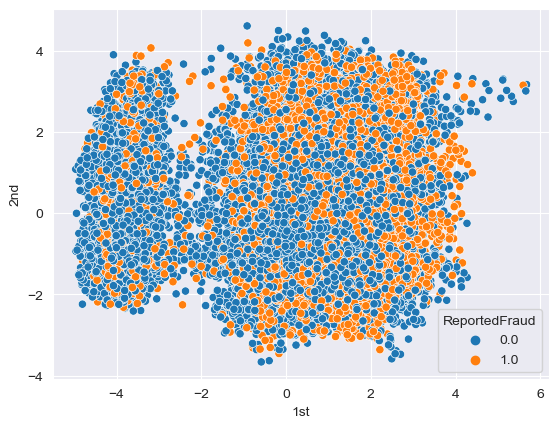

In [28]:
sns.scatterplot(data = pca_df,x = "1st",y = "2nd",hue="ReportedFraud",)
plt.show()

In [29]:
fig = px.scatter_3d(pca_df, x="1st", y="2nd", z="3rd",color='ReportedFraud')
fig.show()

### Since there was only 7.94% of variance explained from the three features of PCA we can't expect any differeantiator for Fraud and Not Fraud cases.

### <center>T-SNE (t-distributed stochastic neighborhood embedding)

In [30]:
from sklearn.manifold import TSNE

In [31]:
model = TSNE(n_components=2, random_state=0)
tsne_data = model.fit_transform(df1)

In [32]:
tsne_data = np.vstack((tsne_data.T,df['ReportedFraud'].to_numpy())).T
tsne_df = pd.DataFrame(data=tsne_data, columns=("dim1","dim2","ReportedFraud"))

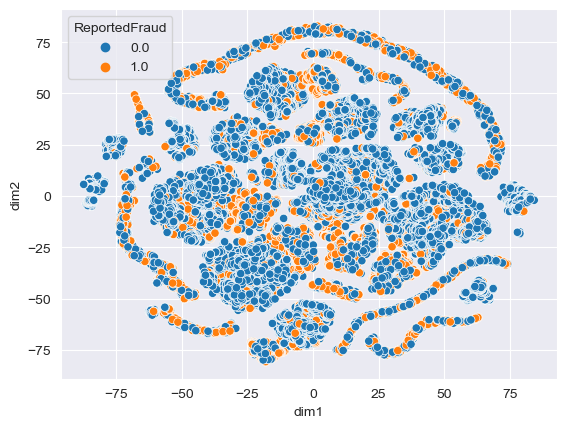

In [33]:
sns.scatterplot(data = tsne_df,x = "dim1",y = "dim2",hue="ReportedFraud",)
plt.show()

### Running tsne with multiple perplexity and iteration values

In [34]:
model = TSNE(n_components=2, random_state=0,n_iter=2000, perplexity=50,n_jobs=4)
tsne_data = model.fit_transform(df1)

tsne_data = np.vstack((tsne_data.T,df['ReportedFraud'].to_numpy())).T
tsne_df = pd.DataFrame(data=tsne_data, columns=("dim1","dim2","ReportedFraud"))

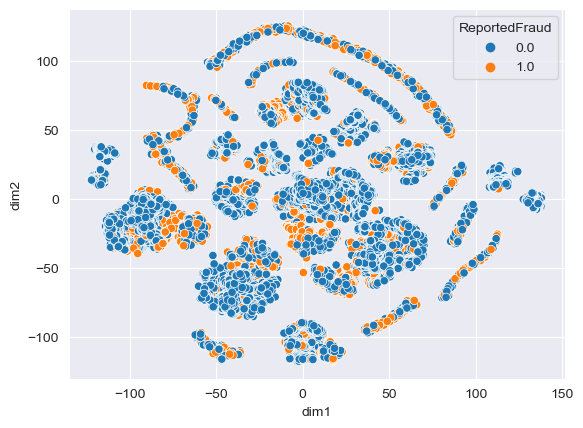

In [35]:
sns.scatterplot(data = tsne_df,x = "dim1",y = "dim2",hue="ReportedFraud")
plt.show()

In [36]:
model = TSNE(n_components=2, random_state=0,n_iter=4000, perplexity=50,n_jobs=4)
tsne_data = model.fit_transform(df1)

tsne_data = np.vstack((tsne_data.T,df['ReportedFraud'].to_numpy())).T
tsne_df = pd.DataFrame(data=tsne_data, columns=("dim1","dim2","ReportedFraud"))

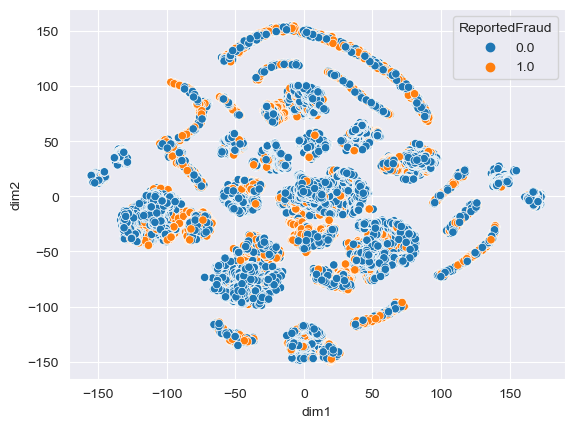

In [37]:
sns.scatterplot(data = tsne_df,x = "dim1",y = "dim2",hue="ReportedFraud")
plt.show()

In [40]:
model = TSNE(n_components=2, random_state=0,n_iter=6000, perplexity=50,n_jobs=-1)
tsne_data = model.fit_transform(df1)

tsne_data = np.vstack((tsne_data.T,df['ReportedFraud'].to_numpy())).T
tsne_df = pd.DataFrame(data=tsne_data, columns=("dim1","dim2","ReportedFraud"))

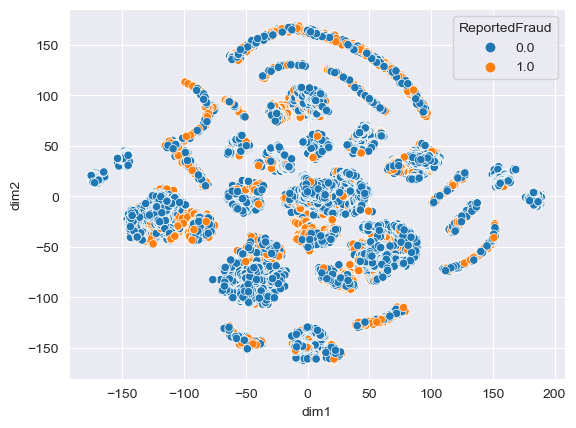

In [41]:
sns.scatterplot(data = tsne_df,x = "dim1",y = "dim2",hue="ReportedFraud")
plt.show()

In [42]:
model = TSNE(n_components=2, random_state=0,n_iter=2000, perplexity=70,n_jobs=-1)
tsne_data = model.fit_transform(df1)

tsne_data = np.vstack((tsne_data.T,df['ReportedFraud'].to_numpy())).T
tsne_df = pd.DataFrame(data=tsne_data, columns=("dim1","dim2","ReportedFraud"))

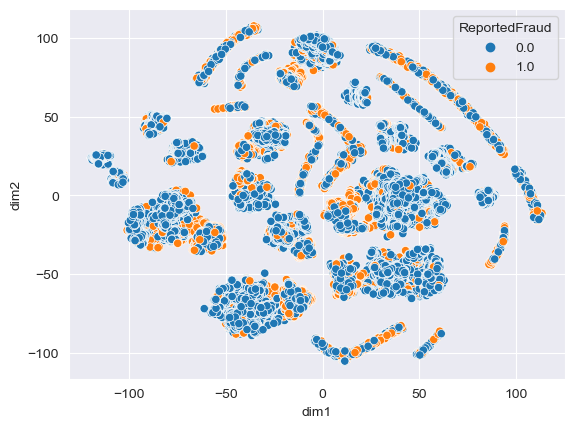

In [43]:
sns.scatterplot(data = tsne_df,x = "dim1",y = "dim2",hue="ReportedFraud")
plt.show()

In [38]:
model = TSNE(n_components=2, random_state=0,n_iter=4000, perplexity=70,n_jobs=-1)
tsne_data = model.fit_transform(df1)

tsne_data = np.vstack((tsne_data.T,df['ReportedFraud'].to_numpy())).T
tsne_df = pd.DataFrame(data=tsne_data, columns=("dim1","dim2","ReportedFraud"))

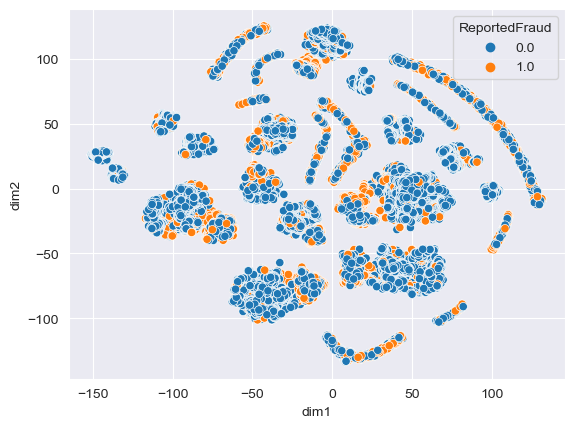

In [39]:
sns.scatterplot(data = tsne_df,x = "dim1",y = "dim2",hue="ReportedFraud")
plt.show()

In [44]:
model = TSNE(n_components=2, random_state=0,n_iter=6000, perplexity=70,n_jobs=-1)
tsne_data = model.fit_transform(df1)

tsne_data = np.vstack((tsne_data.T,df['ReportedFraud'].to_numpy())).T
tsne_df = pd.DataFrame(data=tsne_data, columns=("dim1","dim2","ReportedFraud"))

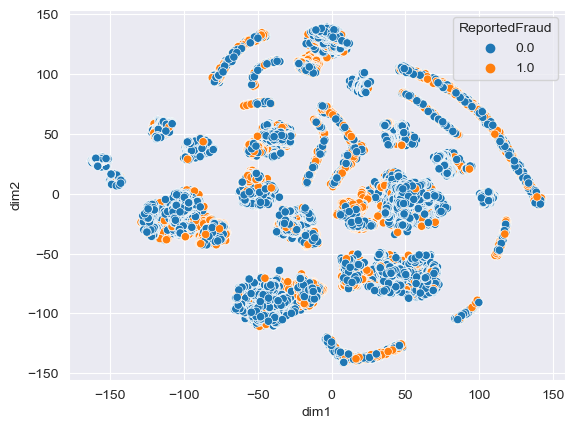

In [45]:
sns.scatterplot(data = tsne_df,x = "dim1",y = "dim2",hue="ReportedFraud")
plt.show()

### Running T-sne Multiple times yields a stable output it should be that the data is randomly distributed inthe Higher dimensional space and there can't be a clear seperation between fraud and not fraud cases. 
Conclusion: Maybe the the data is distributed randomly in the higher domensional space.